In [114]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import numpy as np
import json
import sys
%matplotlib inline
os.getcwd()

'd:\\Documents\\projects\\Wildfire-Area'

In [115]:
fires = pd.read_csv("./data/liste_incendies_ du_28_01_2020.csv", skiprows=2, delimiter=";")

In [116]:
fires.head()

,Année,Numéro,Type de feu,Département,Code INSEE,Commune,Lieu-dit,Code du carreau DFCI,Alerte,Origine de l'alerte,Surface parcourue (m2)
0,1973,6389,9,66,66196,Sorède,piste dfci al33 mas berdaguer,GC42F25,1973-01-07 12:41:00,3.0,NaN
1,1973,8,0,06,06060,Falicon,FALICON,R21B03,1973-01-09 13:50:00,3.0,10000.0
2,1973,6102,9,84,84078,Mondragon,NaN,N20H16,1973-01-12 18:35:00,NaN,0.0
3,1973,6106,9,84,84140,Vaugines,NaN,O21C16,1973-01-13 18:30:00,NaN,0.0
4,1973,4789,9,34,34078,Claret,NaN,M21G13,1973-01-21 16:00:00,NaN,0.0


In [117]:
fires.shape

(490401, 11)

In [118]:
fires['date'] = fires['Alerte'].astype("datetime64")

In [119]:
fires['month'], fires['day'], fires['year'] = fires['date'].dt.month, fires['date'].dt.day, fires['date'].dt.year

In [120]:
fires.describe()

,Année,Numéro,Type de feu,Origine de l'alerte,Surface parcourue (m2),month,day,year
count,490401.000000,490401.000000,490401.000000,230880.000000,3.525530e+05,490401.000000,490401.000000,490401.000000
mean,1993.928236,5831.041370,6.906146,3.044287,2.632287e+04,6.415354,15.698408,1993.928236
std,13.000699,4048.885052,3.802695,0.826726,5.987885e+05,2.842584,8.781069,13.000699
min,1973.000000,1.000000,0.000000,1.000000,0.000000e+00,1.000000,1.000000,1973.000000
25%,1983.000000,2611.000000,9.000000,3.000000,0.000000e+00,4.000000,8.000000,1983.000000
50%,1991.000000,5226.000000,9.000000,3.000000,0.000000e+00,7.000000,16.000000,1991.000000
75%,2005.000000,8192.000000,9.000000,3.000000,1.000000e+03,8.000000,23.000000,2005.000000
max,2020.000000,19751.000000,9.000000,6.000000,1.158000e+08,12.000000,31.000000,2020.000000


C:\Users\luism\AppData\Roaming\Python\Python37\site-packages\numpy\lib\histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\luism\AppData\Roaming\Python\Python37\site-packages\numpy\lib\histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


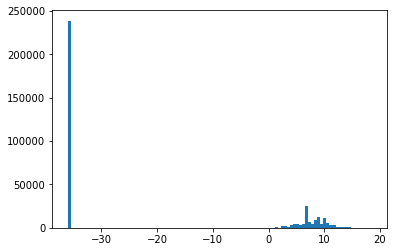

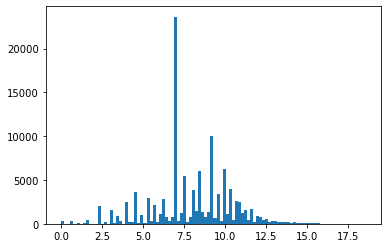

In [121]:
plt.hist(np.log(fires['Surface parcourue (m2)']+sys.float_info.epsilon), bins=100)
plt.show()
plt.close()
plt.hist(np.log(fires['Surface parcourue (m2)'][fires['Surface parcourue (m2)']>0]), bins=100)
plt.show()
plt.close()

In [122]:
any(fires['Surface parcourue (m2)']==0)

True

In [123]:
display(fires['Alerte'].min())
display(fires['Alerte'].max())

'1973-01-07 12:41:00'

'2020-01-26 15:38:00'

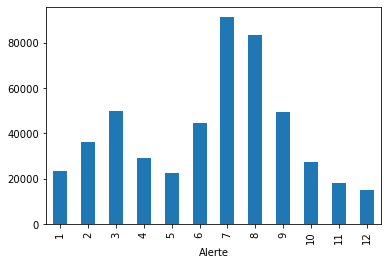

In [124]:
fires.groupby(fires['Alerte'].astype("datetime64").dt.month)['Alerte'].count().plot(kind="bar")

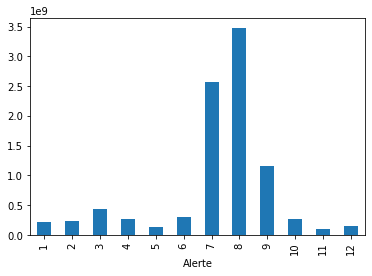

In [125]:
fires.groupby(fires['Alerte'].astype("datetime64").dt.month)['Surface parcourue (m2)'].sum().plot(kind="bar")

C:\Users\luism\AppData\Roaming\Python\Python37\site-packages\pandas\plotting\_matplotlib\boxplot.py:264: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  bp = ax.boxplot(values, **kwds)


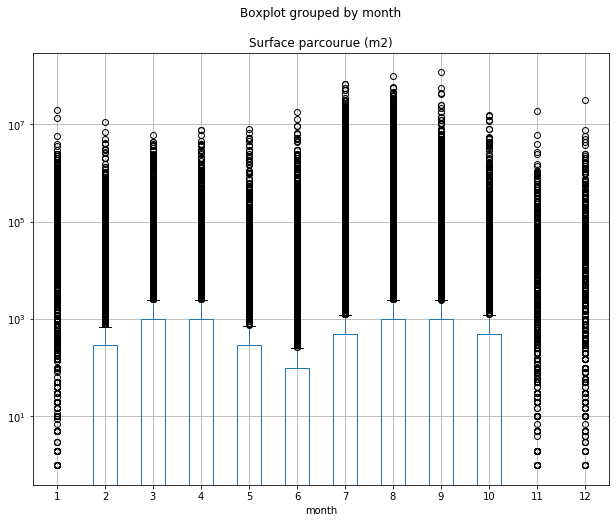

In [126]:
fig, ax = plt.subplots(figsize=(10,8))
ax.set_yscale('log')
fires.boxplot(column=['Surface parcourue (m2)'], by='month', ax=ax)
plt.show()
plt.close()

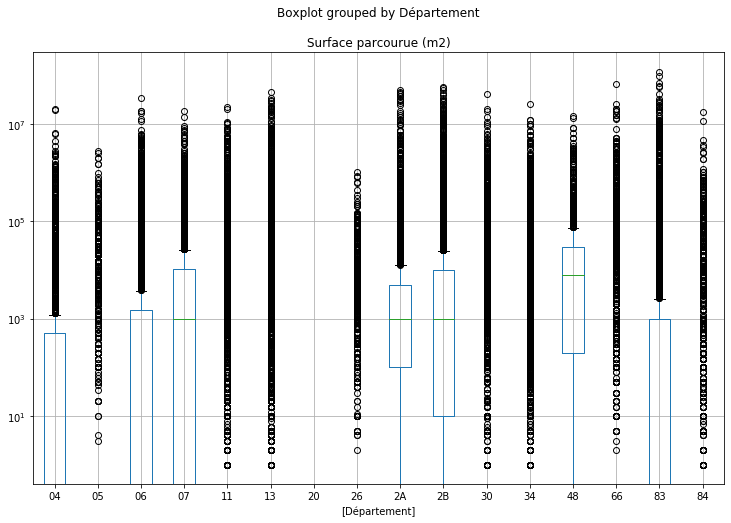

In [127]:
fig, ax = plt.subplots(figsize=(12,8))
ax.set_yscale('log')
fires.boxplot(column=['Surface parcourue (m2)'], by=['Département'], ax=ax)
plt.show()
plt.close()

<Figure size 864x576 with 0 Axes>

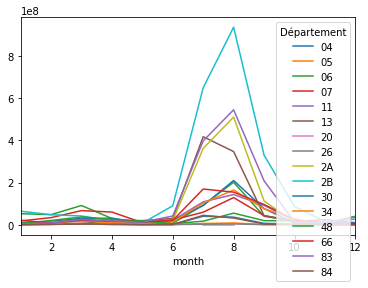

In [128]:
plt.figure(figsize=(12,8))
fires.groupby(['month', 'Département'])['Surface parcourue (m2)'].sum().unstack().plot()
plt.show()
plt.close()

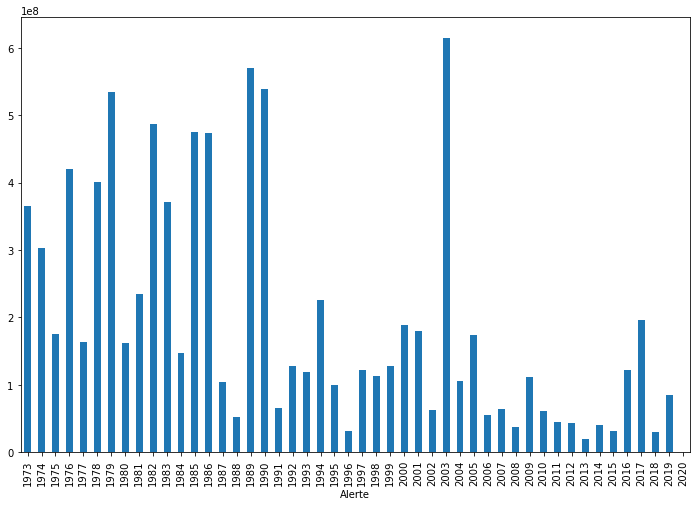

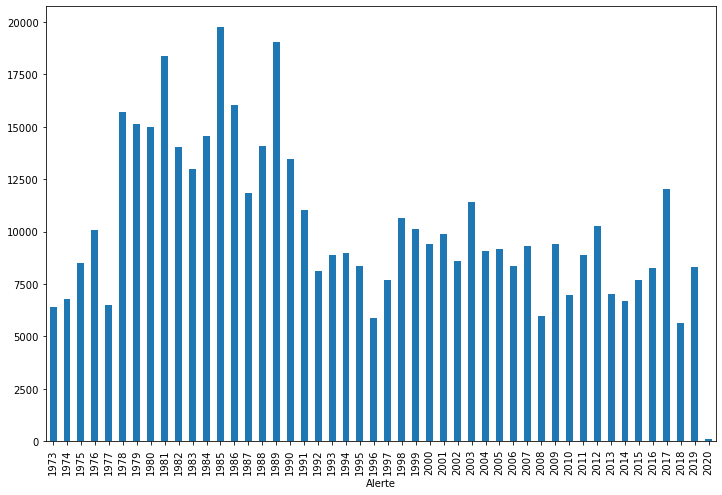

In [129]:
plt.figure(figsize=(12,8))
fires.groupby(fires['Alerte'].astype("datetime64").dt.year)['Surface parcourue (m2)'].sum().plot(kind="bar")
plt.show()
plt.close()
plt.figure(figsize=(12,8))
fires.groupby(fires['Alerte'].astype("datetime64").dt.year)['Alerte'].count().plot(kind="bar")
plt.show()
plt.close()

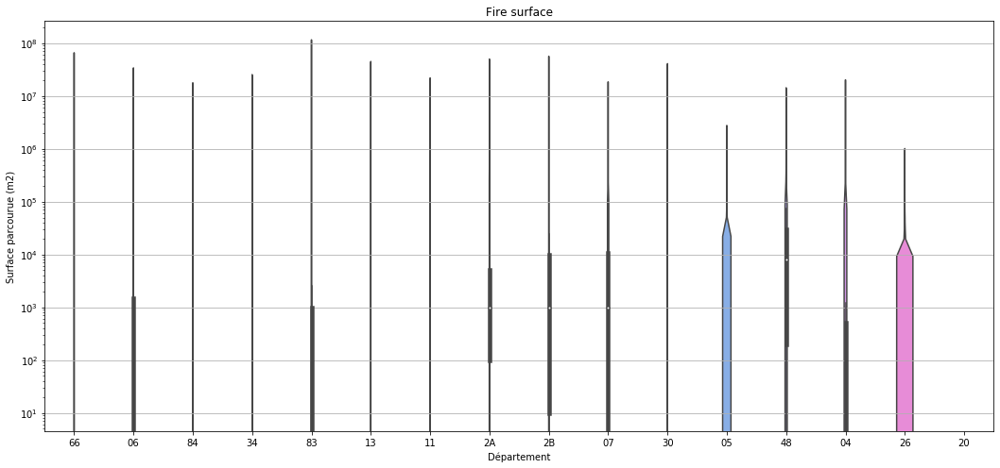

In [130]:
import seaborn as sns

fig, axes = plt.subplots(figsize=(18,8))

# axes.violinplot(dataset=[fires[fires['Département'] == elt]["Surface parcourue (m2)"].values for elt in set(fires['Département'])] )
sns.violinplot('Département','Surface parcourue (m2)', data=fires, ax = axes)


axes.set_title('Fire surface')
axes.yaxis.grid(True)
axes.set_yscale('log')
axes.set_xlabel('Département')
axes.set_ylabel('Surface parcourue (m2)')

plt.show()
plt.close()

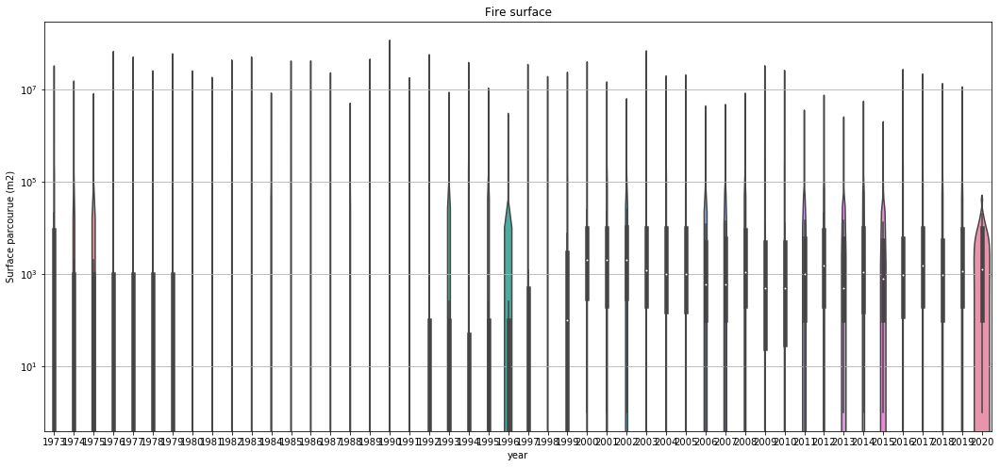

In [131]:
import seaborn as sns

fig, axes = plt.subplots(figsize=(18,8))

# axes.violinplot(dataset=[fires[fires['Département'] == elt]["Surface parcourue (m2)"].values for elt in set(fires['Département'])] )
sns.violinplot('year','Surface parcourue (m2)', data=fires, ax = axes)


axes.set_title('Fire surface')
axes.yaxis.grid(True)
axes.set_yscale('log')
axes.set_xlabel('year')
axes.set_ylabel('Surface parcourue (m2)')

plt.show()
plt.close()

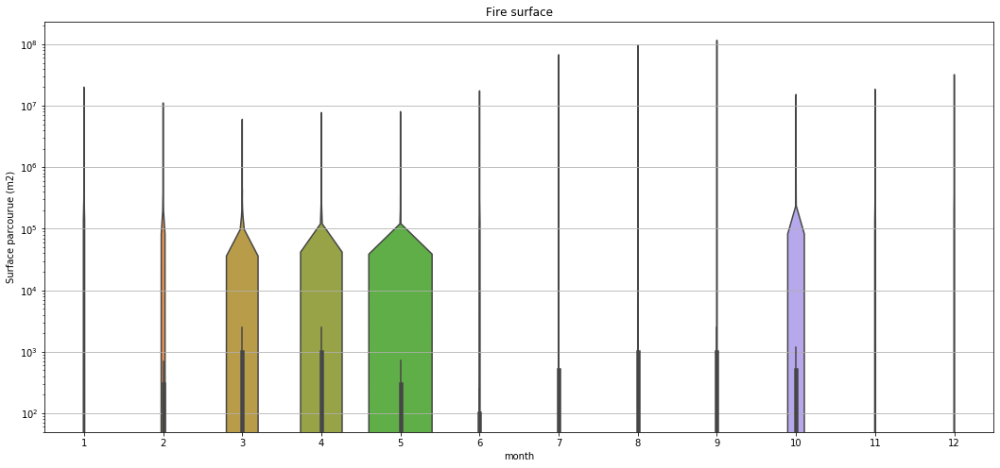

In [132]:
import seaborn as sns

fig, axes = plt.subplots(figsize=(18,8))

# axes.violinplot(dataset=[fires[fires['Département'] == elt]["Surface parcourue (m2)"].values for elt in set(fires['Département'])] )
sns.violinplot('month','Surface parcourue (m2)', data=fires, ax = axes)


axes.set_title('Fire surface')
axes.yaxis.grid(True)
axes.set_yscale('log')
axes.set_xlabel('month')
axes.set_ylabel('Surface parcourue (m2)')

plt.show()
plt.close()

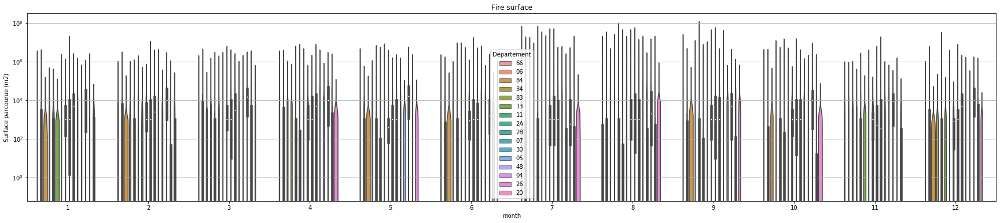

In [133]:
import seaborn as sns

fig, axes = plt.subplots(figsize=(30,6))

# axes.violinplot(dataset=[fires[fires['Département'] == elt]["Surface parcourue (m2)"].values for elt in set(fires['Département'])] )
sns.violinplot(x='month', y='Surface parcourue (m2)', hue="Département", data=fires, ax = axes)


axes.set_title('Fire surface')
axes.yaxis.grid(True)
axes.set_yscale('log')
axes.set_xlabel('month')
axes.set_ylabel('Surface parcourue (m2)')

plt.show()
plt.close()

In [134]:
fires.groupby(fires['Commune'])['Alerte'].count()

Commune
Abeilhan                     202
Abriès                        20
Accons                        16
Adissan                      274
Adrets-de-l'Estérel (Les)    211
                            ... 
Étoile-Saint-Cyrice            5
Étoile-sur-Rhône             146
Évenos                       125
Évisa                        133
Île-Rousse (L')              128
Name: Alerte, Length: 3476, dtype: int64

In [135]:
fires.dtypes

Année                              int64
Numéro                             int64
Type de feu                        int64
Département                       object
Code INSEE                        object
Commune                           object
Lieu-dit                          object
Code du carreau DFCI              object
Alerte                            object
Origine de l'alerte              float64
Surface parcourue (m2)           float64
date                      datetime64[ns]
month                              int64
day                                int64
year                               int64
dtype: object

In [136]:
fires.isna().sum() / fires.shape[0]

Année                     0.000000
Numéro                    0.000000
Type de feu               0.000000
Département               0.000000
Code INSEE                0.000063
Commune                   0.000063
Lieu-dit                  0.590865
Code du carreau DFCI      0.000000
Alerte                    0.000000
Origine de l'alerte       0.529202
Surface parcourue (m2)    0.281092
date                      0.000000
month                     0.000000
day                       0.000000
year                      0.000000
dtype: float64

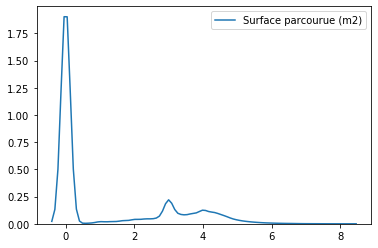

In [137]:
import seaborn
logSur = np.log10(np.clip(fires['Surface parcourue (m2)'], a_min=1, a_max=None))
seaborn.kdeplot(logSur)

In [138]:
print(set(fires['Commune']))

 'Saint-Papoul', 'Chabottes', 'Ferrières-Poussarou', 'Gignac', 'Villars', 'Poulx', 'Rayol-Canadel-sur-Mer', 'Saint-Bresson', 'Cucugnan', 'Larnas', 'Pin (Le)', 'Osséja', 'Rezza', 'Andancette', 'Mandelieu-la-Napoule', 'Espéraza', 'Devesset', 'Réauville', 'Cers', 'Nébian', 'Saint-Laurent-des-Arbres', 'Croix-sur-Roudoule (La)', 'Saint-Martin-de-Castillon', 'Villar-Saint-Anselme', 'Valderoure', 'Châteauneuf-Val-Saint-Donat', 'Charols', 'Brusquet (Le)', 'Gardie', 'Monts-Verts (Les)', 'Rigarda', 'Laveyrune', 'Verquières', 'Saint-Paul-la-Coste', "Saint-Pierre-d'Argençon", 'Roussillon', 'Ratières', 'Cabrières', 'Arras-sur-Rhône', 'Bessas', 'Coudoux', 'Junas', 'Réotier', 'Saint-Étienne-de-Serre', 'Saint-Jean-de-Muzols', 'Savignargues', 'Ribeyret', 'Arvieux', 'Lézan', 'Saint-André-de-Roquelongue', 'Casalta', 'Beauvoisin', 'Naussac', 'Garde-Adhémar (La)', 'Monticello', 'Bigorno', 'Laragne-Montéglin', 'Cruis', 'Soleilhas', 'Vesc', 'Montegrosso', 'Hermaux (Les)', 'San-Gavino-di-Tenda', 'Poggio-Marin

In [139]:
temperatures = pd.read_csv("./data/donnees-synop-essentielles-omm.csv", sep=";", low_memory=False)
display(temperatures.head())
display(temperatures.describe())
stats = dict(temperatures.isna().sum() / temperatures.shape[0])
print(json.dumps(stats, indent=4, sort_keys=True))
display(np.sum(fires['Alerte'] > temperatures['Date'].min()))
display(temperatures['Date'].min())
set(temperatures['communes (name)'].str.lower()).intersection(set(fires['Commune'].str.lower()))

ParserError: Error tokenizing data. C error: out of memory

In [0]:
fires[['dep', 'dat']] = fires[['Département', 'Alerte']]
temperatures[['dep',  'dat']] = temperatures[['department (code)',  'Date']]
fires['dat'] = pd.to_datetime(fires['dat'])
temperatures['dat'] = pd.to_datetime(temperatures['dat'])
fires['dep'] = fires['dep'].astype(str)
temperatures['dep'] = temperatures['dep'].astype(str)
temperatures = temperatures.sort_values(by=['dat', "dep"])

In [0]:
set(fires['dep']).intersection(set(temperatures['dep'])) 

In [0]:
joined = pd.merge_asof(left=fires, right=temperatures, on='dat', by='dep', tolerance=pd.Timedelta('2ms'), allow_exact_matches=True)

In [59]:
from collections import Counter
Counter(temperatures['communes (name)'])

Counter({'Perros-Guirec': 28466,
         'Blagnac': 28793,
         'Matoury': 28803,
         'Parçay-Meslay': 28722,
         nan: 217988,
         'Barberey-Saint-Sulpice': 28786,
         'Lucciana': 28740,
         'Le Lamentin': 28617,
         'Prunay': 21773,
         'Ouges': 28577,
         'Perpignan': 28736,
         'La Hague': 28256,
         'Cerisé': 28402,
         'Saint-Georges': 25158,
         'Chaspuzac': 28707,
         'Gourdon': 28726,
         'Millau': 28306,
         'Embrun': 28677,
         'Ajaccio': 28773,
         'Mont-de-Marsan': 28453,
         'Saint-Laurent-du-Maroni': 25887,
         'Guipavas': 28710,
         'Clermont-Ferrand': 28577,
         'Saint-Aignan-Grandlieu': 28797,
         'Sainte-Marie': 27198,
         "Saint-Denis-d'Oléron": 28325,
         'Holtzheim': 28635,
         'Bourges': 28784,
         'Louey': 28556,
         'Blotzheim': 28775,
         'Bangor': 28775,
         'Les Abymes': 28372,
         'Lorp-Sentaraille': 28583